In [17]:
import datetime as dt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from keras.applications import xception
from mpl_toolkits.axes_grid1 import ImageGrid
from sklearn.linear_model import LogisticRegression
from keras.optimizers.schedules import ExponentialDecay
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import cv2
from scipy.stats import uniform
from tqdm import tqdm
from glob import glob
from keras.models import Model, Sequential
from keras.layers import LSTM, Activation, Dense, Dropout, Input, Embedding, Masking
from keras.src.utils.np_utils import to_categorical
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import tensorflow as tf
from keras.preprocessing import image
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_curve, auc, classification_report, f1_score
import time

### Load Dataset

In [18]:
# Change Path in data_kaggle to your directory which contains Negative and Positive Folders
data_kaggle ='/Users/ayoucruz/Desktop/Data_Science/2nd_Semester/DATA7703 Machine Learning for Data Sci/Project/Dataset/Surface'
class_data= ['Negative','Positive']
image_count = {}
train_data = []

for i , class_data in tqdm(enumerate(class_data)):
    class_folder = os.path.join(data_kaggle,class_data)
    label = class_data
    image_count[class_data] = []
    
    for path in os.listdir(os.path.join(class_folder)):
        im = cv2.imread(f'{class_data}/{path}')
        image_count[class_data].append(class_data)
        train_data.append(['{}/{}'.format(class_data, path), i, class_data, im.shape])

2it [00:11,  5.72s/it]


### Dataset Investigation and Immutation

In [19]:
for key, value in image_count.items():
    print('{0} -> {1}'.format(key, len(value)))
    
df = pd.DataFrame(train_data, columns=['File', 'ID', 'Label','Size'])
print(df.describe())
print(df.isnull().sum())
print(df.shape)
print(df.nunique())
# Check image shape = (227, 227, 3)
for i in range(len(df['Size'])-1):
    if df['Size'][i] != (227, 227, 3):
        print(df['File'][i])

Negative -> 20000
Positive -> 20000
                 ID
count  40000.000000
mean       0.500000
std        0.500006
min        0.000000
25%        0.000000
50%        0.500000
75%        1.000000
max        1.000000
File     0
ID       0
Label    0
Size     0
dtype: int64
(40000, 4)
File     40000
ID           2
Label        2
Size         1
dtype: int64


### Images Preprocessing

In [20]:
def to_grayscale_then_rgb(image):
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.grayscale_to_rgb(image)
    return image

def read_img(filepath, size, data_kaggle):
    img = image.load_img(os.path.join(data_kaggle, filepath), target_size=size)
    #convert image to array
    img = image.img_to_array(img)
    return img

def grayscale_tensor(dataframe, data_kaggle):
    grayscale_list = []
    for image_path in dataframe:
        img = read_img(image_path,(100,100), data_kaggle)
        grayscale_image = to_grayscale_then_rgb(img/120)
        grayscale_list.append(grayscale_image)
        
    return grayscale_list

In [21]:
# Use images_tensor variables to perform CNN, SVM, Decision trees, kNN
images_tensor = grayscale_tensor(df['File'], data_kaggle)

Text(0.5, 0.98, 'GRAYSCALE')

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

[Text(0.0, 0, ''), Text(0.5, 0, ''), Text(1.0, 0, '')]

[Text(0, 0.0, ''), Text(0, 0.5, ''), Text(0, 1.0, '')]

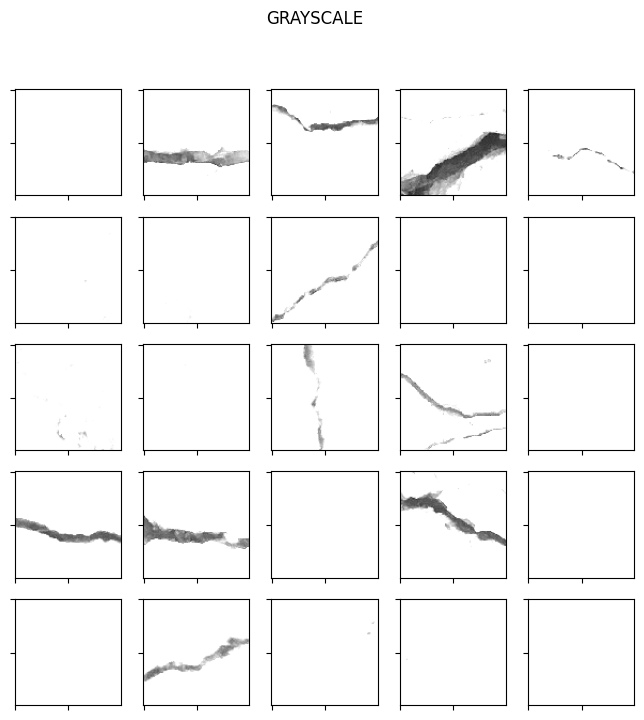

In [22]:
np.random.seed(0)
nb_rows = 5
nb_cols = 5
fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(8,8))
plt.suptitle('GRAYSCALE')
for i in range(0, nb_rows):
    for j in range(0, nb_cols):
        axs[i, j].xaxis.set_ticklabels([])
        axs[i, j].yaxis.set_ticklabels([])
        axs[i, j].imshow((images_tensor[np.random.randint(40000)]))
plt.show()

In [23]:
train_df = df.copy()
for index in range(len(images_tensor)):
    train_df['File'][index] = images_tensor[index]

/var/folders/jb/tfwdgvdn69n2mpzr99z3z1400000gn/T/ipykernel_3684/543036588.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['File'][index] = images_tensor[index]
/var/folders/jb/tfwdgvdn69n2mpzr99z3z1400000gn/T/ipykernel_3684/543036588.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['File'][index] = images_tensor[index]
/var/folders/jb/tfwdgvdn69n2mpzr99z3z1400000gn/T/ipykernel_3684/543036588.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

### Multilayer Perceptron Model

In [24]:
start_time = time.time()
dataset_df = train_df[['File','ID']]
X = np.array(dataset_df['File'].to_list())
y = np.array(dataset_df['ID'])
best_model = None
best_accuracy = 0.0
# learningrate = [0.00001]
# batchsize = [512]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(100, 100, 3)),
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(128, activation='relu'),  
    tf.keras.layers.Dense(64, activation='relu'),   
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')   # Output layer (2 classes)
])
custom_optimizer = tf.keras.optimizers.Adam()

model.compile(optimizer=custom_optimizer,
            loss='binary_crossentropy',
            metrics=['accuracy'])
history = model.fit(X_train, y_train, validation_data=(X_test, y_test))
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5)  # Convert probabilities to binary predictions
accuracy = accuracy_score(y_test, y_pred)
if accuracy > best_accuracy:
    best_accuracy = accuracy
    best_model = model

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

250/250 [==============================] - 1s 2ms/step
Training time: 47.1938 seconds


<Figure size 1200x400 with 0 Axes>

<Axes: >

Text(0.5, 0, 'Epoch')

Text(0, 0.5, 'Loss')

Text(0.5, 1.0, 'Training and Validation Loss')

<Axes: >

Text(0.5, 0, 'Epoch')

Text(0, 0.5, 'Accuracy')

Text(0.5, 1.0, 'Training and Validation Accuracy')

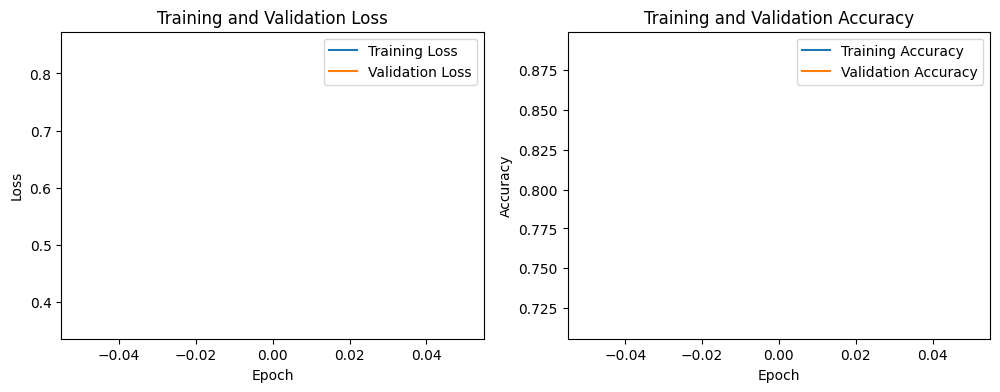

In [25]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')

plt.show()

In [26]:
start_time = time.time()
y_pred = best_model.predict(X_test)
y_pred = (y_pred > 0.5)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1score = f1_score(y_test, y_pred)
end_time = time.time()
prediction_time = end_time - start_time
print(f"Prediction time: {prediction_time:.4f} seconds")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall* 100:.2f}%")
print(f"F1-Score: {f1score * 100:.2f}%")

250/250 [==============================] - 1s 2ms/step
Prediction time: 0.9030 seconds
Accuracy: 89.01%
Precision: 97.49%
Recall: 80.01%
F1-Score: 87.89%


<BarContainer object of 2 artists>

([<matplotlib.axis.XTick at 0x2966d2d90>,
 [Text(0, 0, 'Training Time'), Text(1, 0, 'Prediction Time')])

Text(0.5, 1.0, 'Training and Prediction Times')

Text(0, 0.5, 'Time (seconds)')

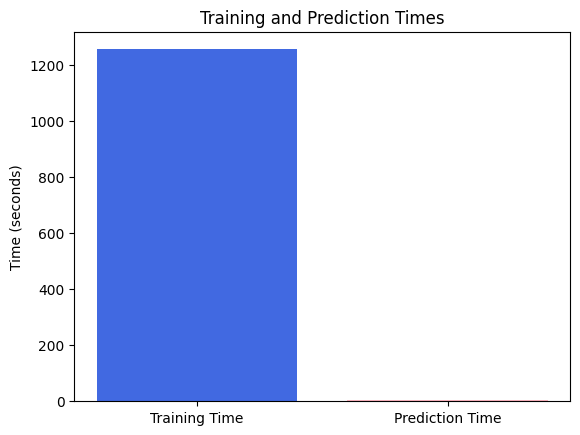

In [27]:
# Computational Complexity of Multilayer Perceptron
height = [1255.5745, 2.8164]
bars = ('Training Time', 'Prediction Time')
x_pos = np.arange(len(bars))

# Create bars with different colors
plt.bar(x_pos, height, color=['royalblue', 'lightpink'])

# Create names on the x-axis
plt.xticks(x_pos, bars)
plt.title("Training and Prediction Times")
plt.ylabel("Time (seconds)")
# Show graph
plt.show()

In [28]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 30000)             0         
                                                                 
 dense_5 (Dense)             (None, 128)               3840128   
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 32)                2080      
                                                                 
 dense_8 (Dense)             (None, 1)                 33        
                                                                 
Total params: 3850497 (14.69 MB)
Trainable params: 3850497 (14.69 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


<Figure size 640x480 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic')

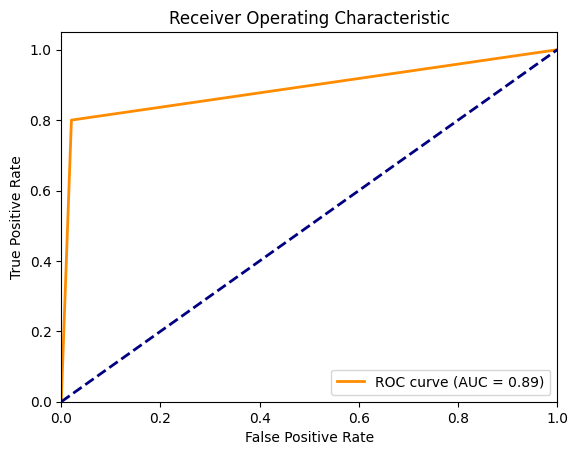

In [29]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve (optional)
import matplotlib.pyplot as plt
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2,label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [30]:
report_dict = classification_report(y_test, y_pred, target_names=["Class Negative", "Class Positive"], output_dict=True)

# Convert the dictionary to a DataFrame for a structured table
report_df = pd.DataFrame(report_dict)

# Print the classification report table
print("Classification Report: ")
print(report_df)

Classification Report: 
           Class Negative  Class Positive  accuracy    macro avg  weighted avg
precision        0.831465        0.974931  0.890125     0.903198      0.902947
recall           0.979571        0.800050  0.890125     0.889811      0.890125
f1-score         0.899462        0.878876  0.890125     0.889169      0.889205
support       4014.000000     3986.000000  0.890125  8000.000000   8000.000000


<Figure size 800x600 with 0 Axes>

<Axes: >

Text(0.5, 36.72222222222221, 'Predicted')

Text(70.72222222222221, 0.5, 'Actual')

Text(0.5, 1.0, 'Confusion Matrix')

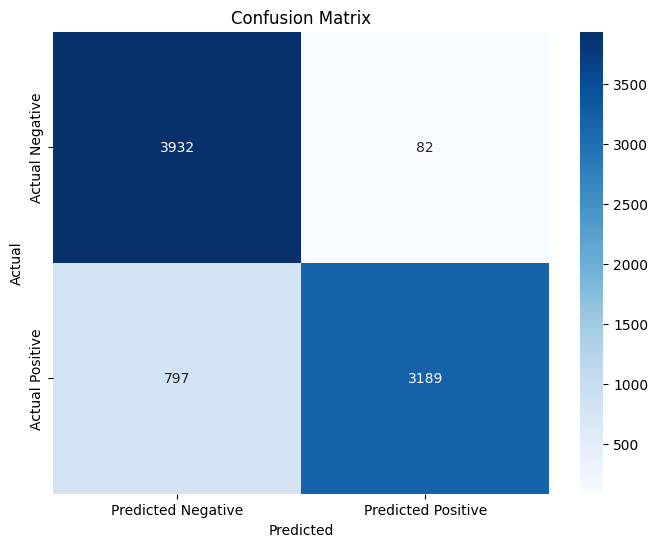

In [31]:
confusion = confusion_matrix(y_test, y_pred)

# Create a heatmap to visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Predicted Negative", "Predicted Positive"],
            yticklabels=["Actual Negative", "Actual Positive"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()